In [1]:
my_login = 
my_password = 
my_app_id = 
my_access_token = 
my_id = 

In [2]:
import requests
import networkx
import time
import collections
import matplotlib.pyplot as plt
import networkx as nx
import operator
import numpy as np
import pandas as pd
from scipy import stats
import math
import vk
import pickle as pkl
import tabulate as t
import time
from tqdm import tqdm
import transliterate as trans
%matplotlib inline

In [3]:
from matplotlib import rcParams

rcParams['figure.figsize'] = (10, 6)
rcParams['figure.dpi'] = 150
rcParams['font.size'] = 14
rcParams['font.family'] = 'Verdana'

In [4]:
session = vk.AuthSession(app_id=my_app_id,user_login=my_login, user_password=my_password,access_token=my_access_token)
api = vk.API(session)

In [76]:
my_friends = api.friends.get(user_id = my_id)
my_friends_info = api.friends.get(user_id = my_id, fields = 'nickname, domain, sex, bdate, city, country, timezone,\
    has_mobile, contacts, education, relation, status, universities')

In [ ]:
edges = set([])
fail_men = set([])
for man in tqdm(list(my_friends)):
    time.sleep(0.35)
    try:
        his_friends = set(list(api.friends.get(user_id = man)))
        intersection_men = his_friends.intersection(my_friends)
        for other_man in list(intersection_men):
            edges.add((man, other_man))
    except:
        fail_men.add(man)

df = pd.DataFrame()
df['main'] = list(edges) + list(my_friends)

df.to_csv('my_friends_graph.csv',index = False, encoding = 'utf8')

In [ ]:
f_1 = open('my_friends.pkl','wb')
pkl.dump(my_friends, f_1)
f_1.close()
f_1 = open('fail_men.pkl','wb')
pkl.dump(fail_men, f_1)
f_1.close()
f_1 = open('edges.pkl','wb')
pkl.dump(edges, f_1)
f_1.close()

In [77]:
edges = pkl.load(open('edges.pkl','rb'))
my_friends = pkl.load(open('my_friends.pkl','rb'))
fail_men = pkl.load(open('fail_men.pkl','rb'))

In [78]:
my_friends_clean = set(my_friends).difference(fail_men)
edges_clean = {(i[0],i[1]) for i in edges if (i[0] in my_friends_clean) and (i[1] in my_friends_clean)}

g = networkx.Graph(directed=False)
g.add_nodes_from(my_friends_clean)
g.add_edges_from(edges_clean)

In [80]:
g_full = g.copy()

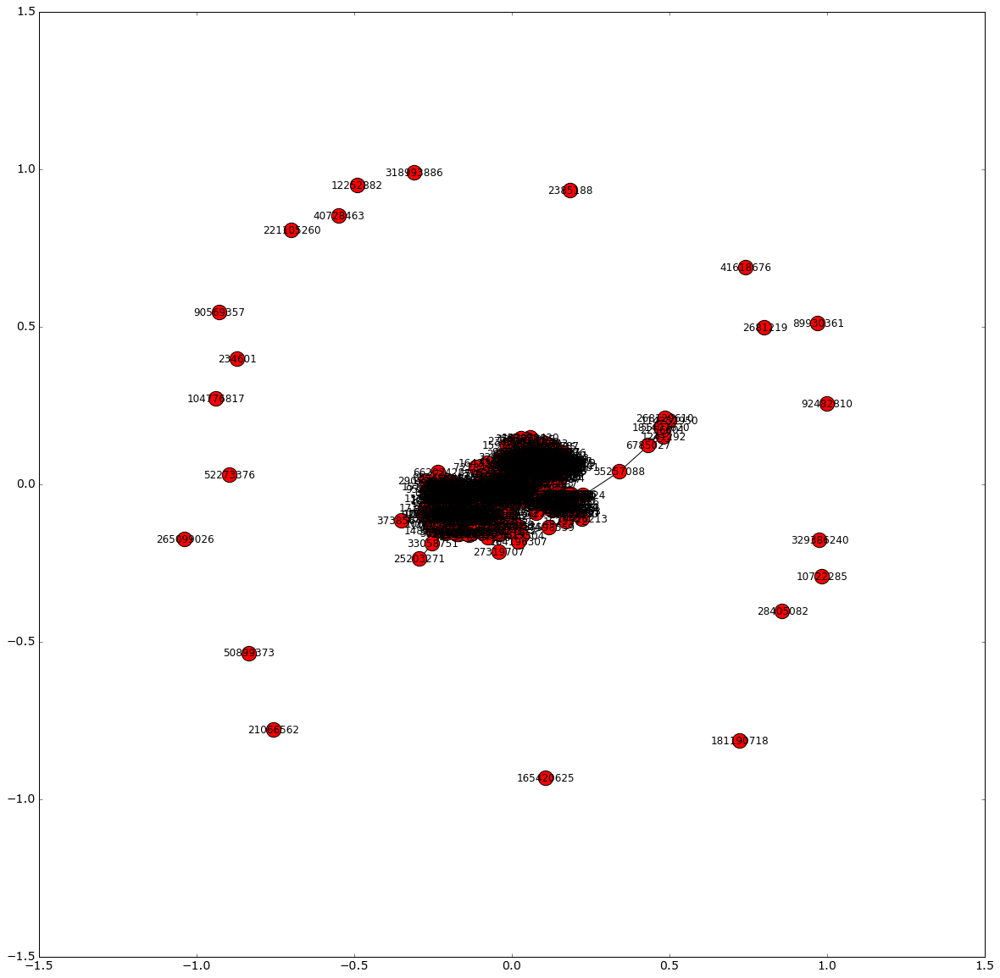

In [74]:
plt.figure(figsize=[20,20])
pos_spring = nx.spring_layout(g) # Fix node positions on all pictures
nx.draw_networkx(g,pos = pos_spring,with_labels=True)

In [ ]:
plt.figure(figsize=[20,20])
#pos_shell = nx.shell_layout(g) # Fix node positions on all pictures
nx.draw_shell(g,with_labels=False)

In [ ]:
plt.figure(figsize=[20,20])
#pos_shell = nx.shell_layout(g) # Fix node positions on all pictures
nx.draw_circular(g,with_labels=False)

In [ ]:
plt.figure(figsize=[20,20])
#pos_shell = nx.shell_layout(g) # Fix node positions on all pictures
nx.draw_networkx_edges(g,pos=nx.spring_layout(g),with_labels=False,)

In [ ]:
plt.figure(figsize=[20,20])
#pos_shell = nx.shell_layout(g) # Fix node positions on all pictures
nx.draw_networkx(g,pos=nx.spring_layout(g),with_labels=False,)

In [ ]:
networkx.write_gml(g, "Ivanitskiy_Ilya.gml")

In [5]:
G = nx.read_gml('Ivanitskiy_Ilya.gml')

In [81]:
cols = ['city','country','graduation','has_mobile','relation','sex','university','bdate','last_name']
attr = {'city':{},'country':{},'graduation':{},'has_mobile':{},'relation':{},'sex':{},'university':{},'bdate':{},'last_name':{}}
for j in tqdm(my_friends_info):
    if j['user_id'] in set(my_friends_clean):
        for i in cols:
            try:
                attr[i].update([(j['user_id'], j[i])])
            except:
                attr[i].update([(j['user_id'], -1)])

In [82]:
cols_mod = ['city','country','graduation','hasMobile','relation','sex','university','bdate','lastName']

In [83]:
def f_for_date(x):
    if x == -1:
        return -1
    else:
        try:
            return int(x.split('.')[2])
        except:
            return -1

In [84]:
def f_for_name(x):
    if x == -1:
        return -1
    else:
        try:
            return trans.translit(x,'ru',reversed = True)
        except:
            return -1

In [85]:
attr['bdate'] = {i:f_for_date(j) for (i,j) in zip(attr['bdate'].keys(), attr['bdate'].values())}
attr['last_name'] = {i:f_for_name(j) for (i,j) in zip(attr['last_name'].keys(), attr['last_name'].values())}

for i in cols:
    if i == 'has_mobile':
        nx.set_node_attributes(g,'hasMobile',attr[i])
    elif i == 'last_name':
        nx.set_node_attributes(g,'lastName',attr[i])
    else:
        nx.set_node_attributes(g,i,attr[i])

In [86]:
networkx.write_gml(g, "Ivanitskiy_Ilya.gml")

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
G = g
plt.figure(figsize=[15,15])
degree_sequence=sorted(nx.degree(G).values(),reverse=True) # degree sequence
#print "Degree sequence", degree_sequence
dmax=max(degree_sequence)

plt.loglog(degree_sequence,'b-',marker='o')
plt.title("Degree rank plot")
plt.ylabel("degree")
plt.xlabel("rank")

# draw graph in inset
plt.axes([0.45,0.45,0.45,0.45])
Gcc=sorted(nx.connected_component_subgraphs(G), key = len, reverse=True)[0]
pos=nx.spring_layout(Gcc)
plt.axis('off')
nx.draw_networkx_nodes(Gcc,pos,node_size=20)
nx.draw_networkx_edges(Gcc,pos,alpha=0.4)

plt.savefig("degree_histogram.png")
plt.show()

In [ ]:
networkx.write_gml(g, "Ivanitskiy_Ilya.gml")

In [10]:
g = nx.read_gml('Ivanitskiy_Ilya.gml')
G = nx.read_gml('Ivanitskiy_Ilya.gml')

In [88]:
G_trunkate = nx.Graph()
G_trunkate = g.copy()

In [89]:
for threshold in range(1,26):
    low_degree_nodes = [node for node in g.degree() if g.degree()[node]<threshold]
    # remove nodes with degree less than threshold
    G_trunkate.remove_nodes_from(low_degree_nodes)
    networkx.write_gml(G_trunkate, "IlyaIvanitskiy_trunk"+str(threshold)+".gml")

## We will use on next step graph without nodes with degree, which less more than 2

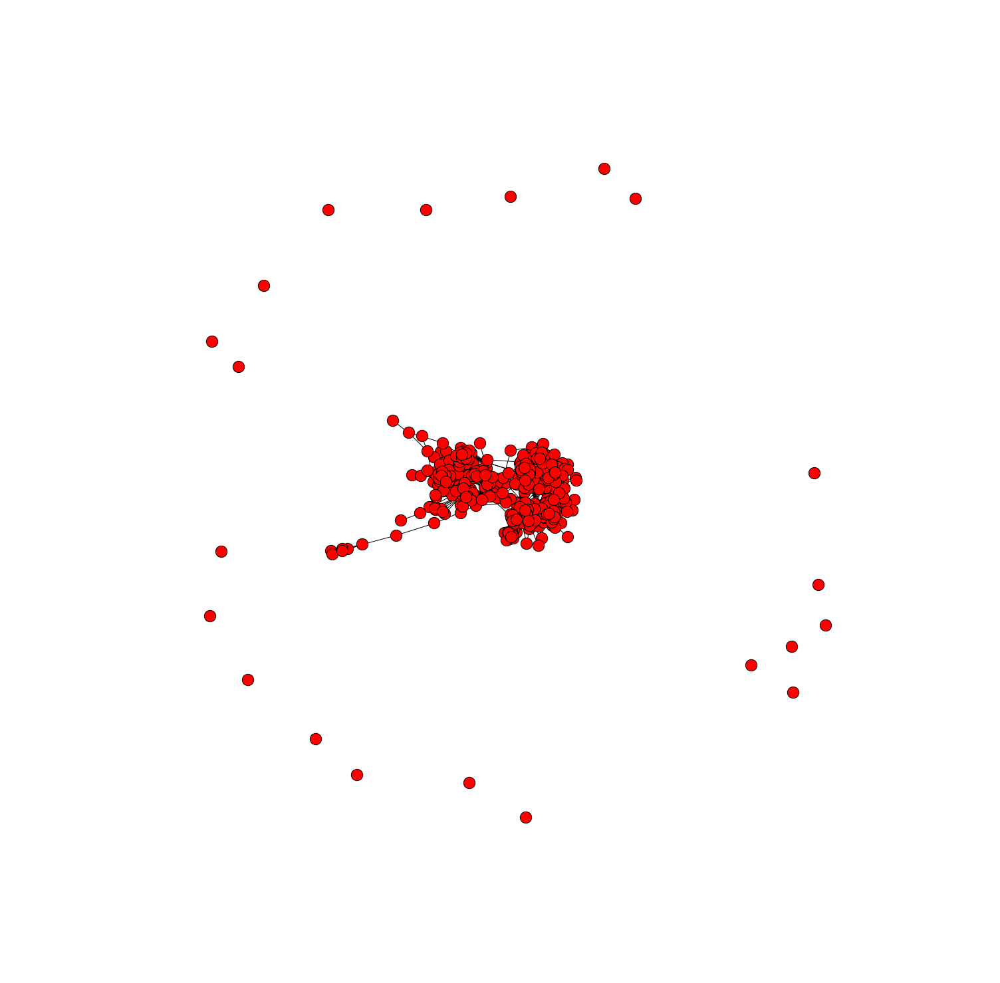

In [90]:
plt.figure(figsize=[20,20])
nx.draw_spring(g)

In [91]:
G = nx.read_gml("IlyaIvanitskiy_trunk"+str(1)+".gml")

In [128]:
pos = nx.layout.spring_layout(G, k = 1./11)

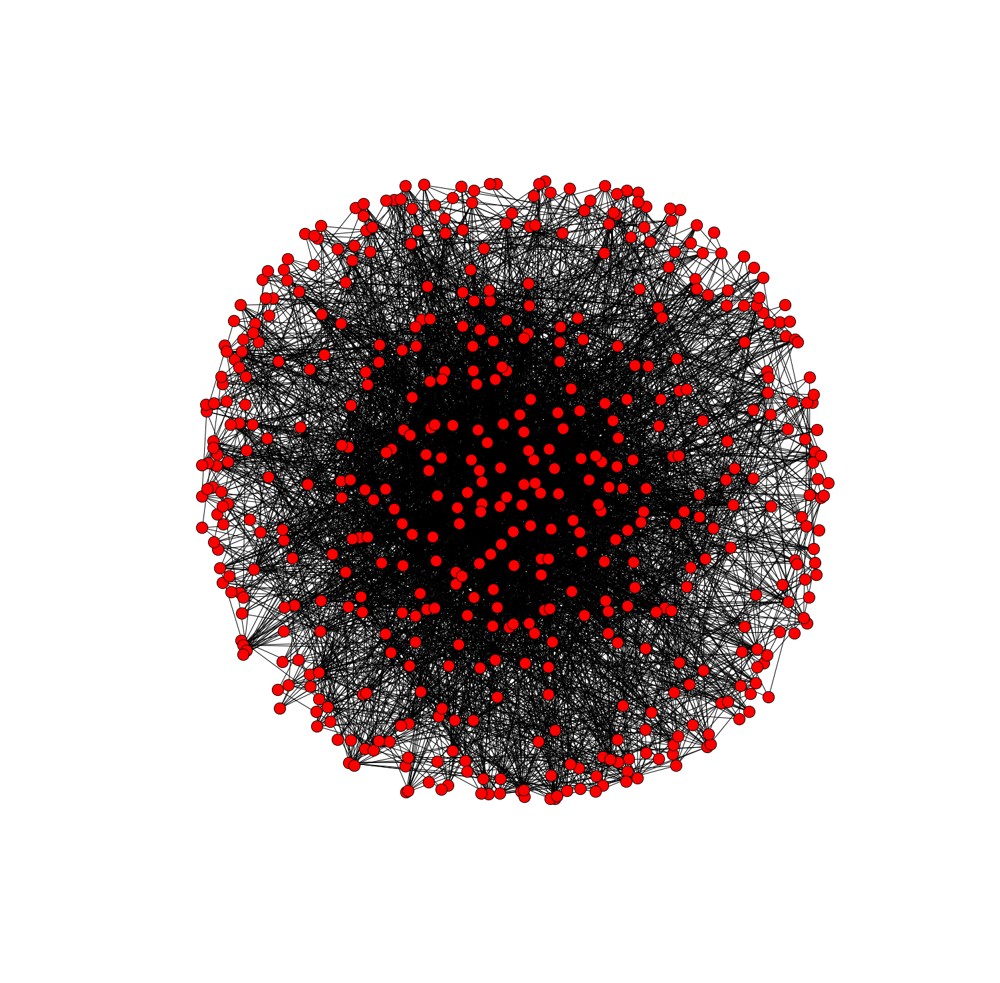

In [139]:
plt.figure(figsize=[20,20])
nx.draw(G,pos = nx.layout.spring_layout(G, k = 1))

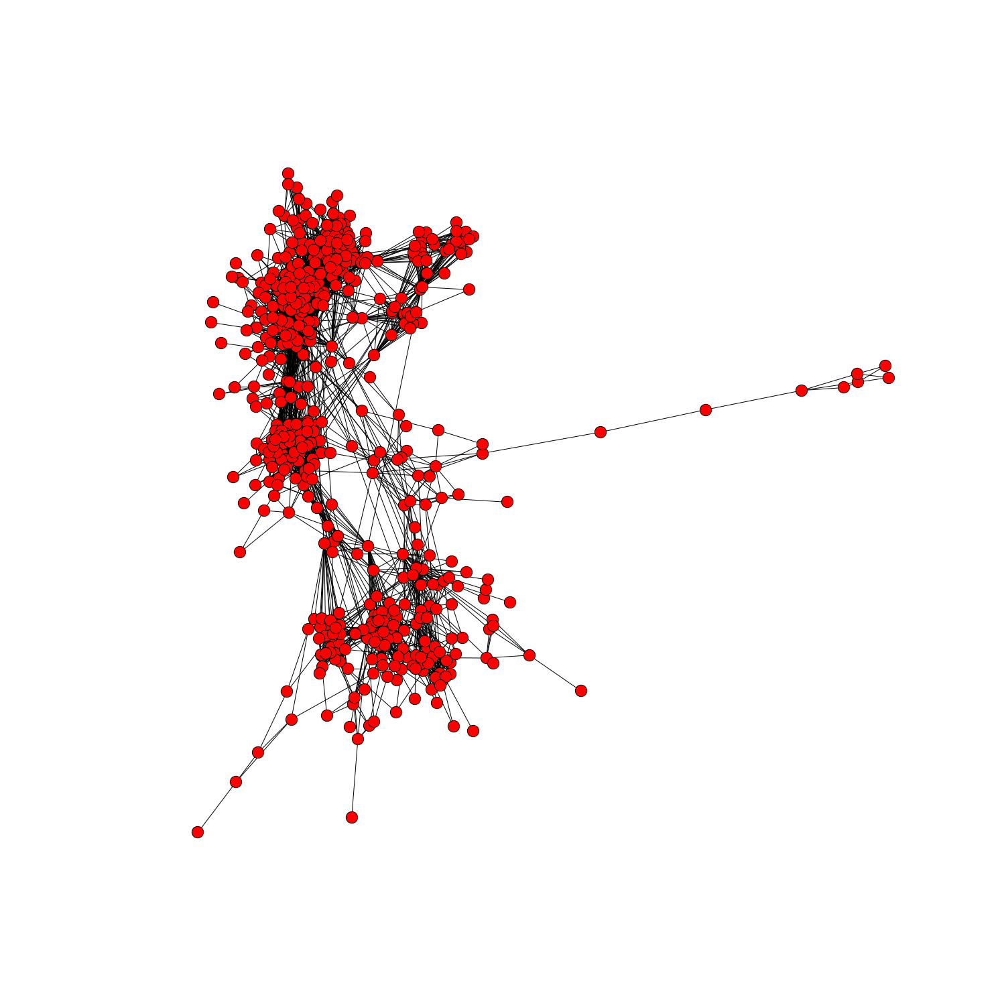

In [137]:
plt.figure(figsize=[20,20])
nx.draw(G,pos = nx.layout.fruchterman_reingold_layout(G))

In [377]:
f = open('pos_4_1.pkl','wb')
pkl.dump(pos,f,1)
f.close()

In [331]:
f = open('pos_4.pkl','rb')
pos = pkl.load(f)
f.close()

In [20]:
clustering = nx.clustering(g)
node_degree = nx.degree(g)

## Let's node-degree distribution for graph with all nodes

In [140]:
from scipy.interpolate import interp1d

In [141]:
a = pd.Series(list(node_degree.values())).value_counts()
a = a.sort_index()

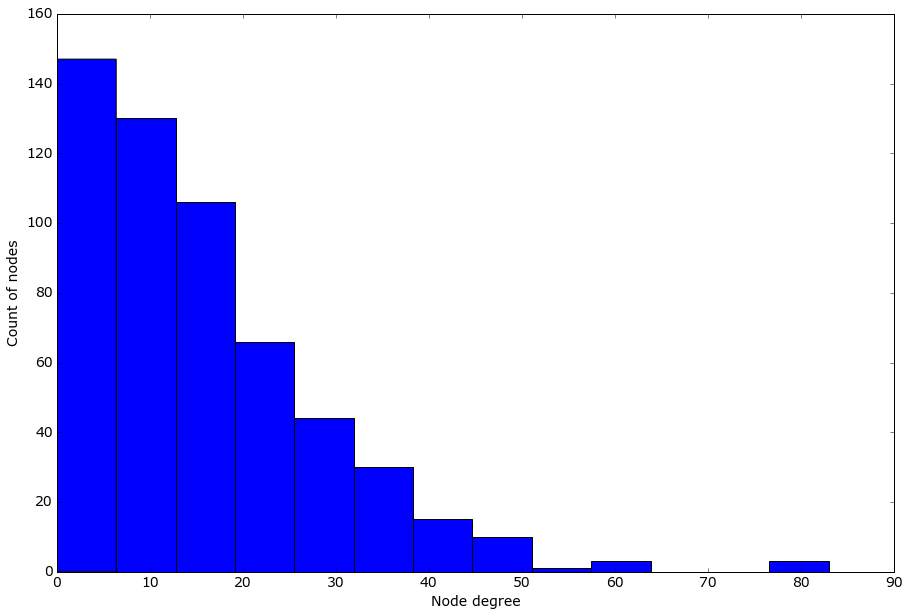

In [147]:
plt.figure(figsize=[15,10])
plt.hist(list(node_degree.values()),bins=13)
plt.xlabel('Node degree')
plt.ylabel('Count of nodes')

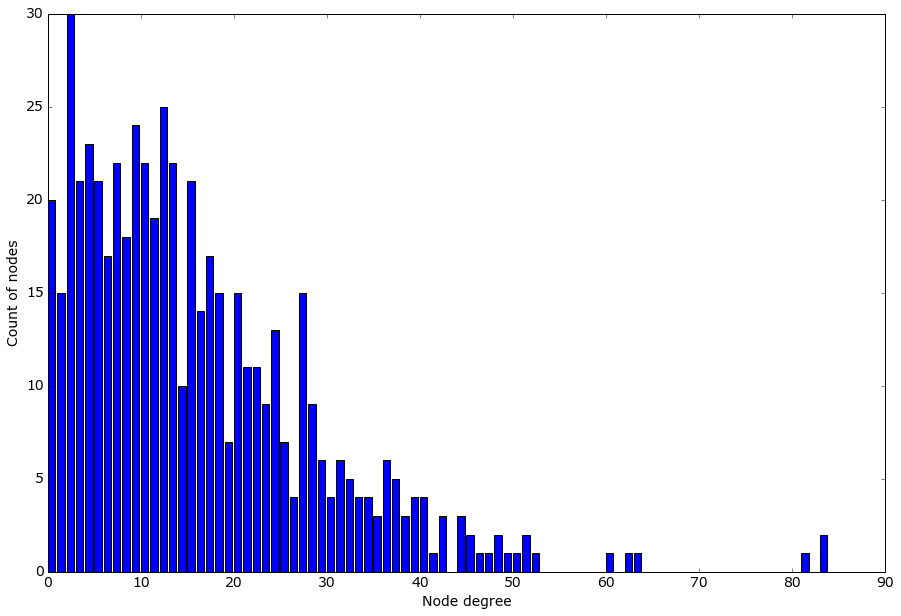

In [145]:
plt.figure(figsize=[15,10])
plt.bar(a.keys(),a.values)
plt.xlabel('Node degree')
plt.ylabel('Count of nodes')

We can see on the plot something what so similar with power distribution

## Let's plot node_degree-clustering_coefficient plot

In [50]:
i = 0
for j in nx.connected_components(G):
    i = i + 1
print('Count of connected components: ',i)

Count of connected components:  1


In [87]:
i = 0
for j in nx.connected_components(g):
    i = i + 1
print('Count of connected components: ',i)

Count of connected components:  22


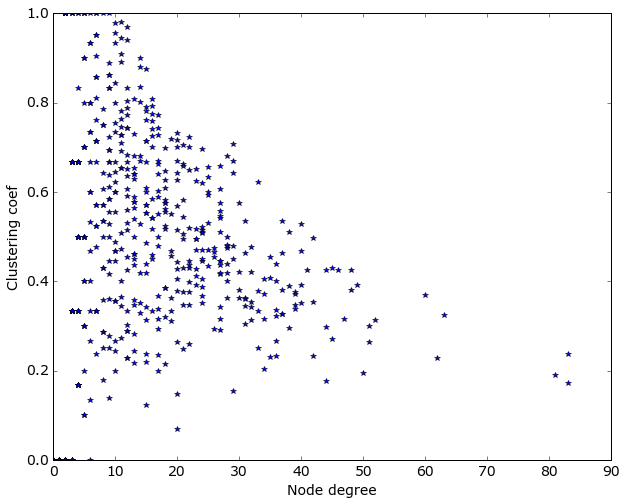

In [150]:
plt.figure(figsize=[10,8])
plt.plot(list(node_degree.values()),list(clustering.values()),'*')
plt.xlabel('Node degree')
plt.ylabel('Clustering coef')

In [155]:
ass_coef = {}
for i in cols_mod:
    ass_coef.update([(i,nx.attribute_assortativity_coefficient(G,i))])
res = pd.DataFrame({'name':list(ass_coef.keys()), 'assortativity_coef':list(ass_coef.values())})
res.sort_values('assortativity_coef',ascending = False).reset_index(drop = True)
res.to_excel('1.xls',sheet_name='1',index = False)

In [154]:
ass_coef = {}
for i in cols_mod:
    ass_coef.update([(i,nx.attribute_assortativity_coefficient(g,i))])
res = pd.DataFrame({'name':list(ass_coef.keys()), 'assortativity_coef':list(ass_coef.values())})
res.sort_values('assortativity_coef',ascending = False).reset_index(drop = True)

,assortativity_coef,name
0,0.282265,university
1,0.238992,city
2,0.072536,sex
3,0.045067,graduation
4,0.038145,bdate
5,0.009567,relation
6,0.000021,lastName
7,-0.010660,country
8,-0.011773,hasMobile


In [ ]:
degrees = G.degree()
sorted_dgr = sorted(degrees.items(), key = operator.itemgetter(1), reverse = True)
dgr_y = [dgr[1] for dgr in sorted_dgr ]
x = np.unique(dgr_y)
x = [x_u for x_u in x] # list of unique degrees
y = np.zeros(len(x))
idx = np.arange(len(x))
for value in dgr_y:
    y[x.index(value)] += 1

y = y/len(x)
x = x[1:]
y = y[1:]
plt.figure()
plt.title('Power law')
plt.plot(x,y, color = 'r', label = 'degree distribution')
plt.legend(loc = 'upper right')
plt.xlabel('node degree')
plt.ylabel('P(#nodes = given degree)')

logX = np.log(x[1:])
logY = np.log(y[1:])

slope, intercept, r_value, p_value, std_err = stats.linregress(logX,logY)
lineX = np.linspace(0,5,30)
lineY = slope * lineX + intercept 


plt.figure()

plt.plot(lineX,lineY, color = 'r', label = 'estimated line', linewidth=2.0)

plt.plot(logX, logY, color = 'b', label = 'loglog scale')
plt.legend(loc = 'upper right')
plt.xlabel('log node degree')
plt.ylabel('log P(#nodes = given degree)')
#plt.title(str('Estimated slope = '+str(slope)))
plt.title('Barabasi Albert Model')

In [ ]:
df = pd.DataFrame()
bc = []
dc = []
d = []
pr = []
cc = []
for i in my_friends_clean:
    bc.append(betweenness_centrality[i])
    dc.append(degree_centrality[i])
    d.append(degrees[i])
    pr.append(page_rank[i])
    cc.append(closeness_centrality[i])
df['node'] = my_friends_clean
df['betweenness_centrality'] = bc
df['degree_centrality'] = dc
df['degrees'] = d
df['page_rank'] = pr
df['closeness_centrality'] = cc

In [ ]:
plt.figure(1, figsize=(16,16))
pos = nx.layout.spring_layout(G)
nx.draw_networkx(G, pos,with_labels=False)

In [ ]:
dc = nx.degree_centrality(G)
plt.figure(1, figsize=(35,35))
nx.draw(G,
          pos = pos,
          nodelist=dc.keys(),
          node_size = [d*6000 for d in list(dc.values())],
          node_color=list(dc.values()),
          font_size=8,
          cmap=plt.cm.Reds
          )
plt.title('degree centrality')

(array([ 132.,  159.,  127.,   60.,   26.,    8.,    2.,    3.,    0.,    2.]),
 array([ 0.00036971,  0.00114318,  0.00191665,  0.00269012,  0.00346359,
         0.00423706,  0.00501053,  0.00578401,  0.00655748,  0.00733095,
         0.00810442]),
 <a list of 10 Patch objects>)

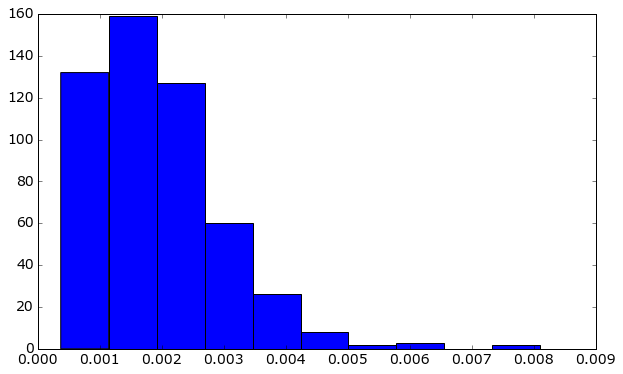

In [198]:
plt.hist(list(pr.values()))

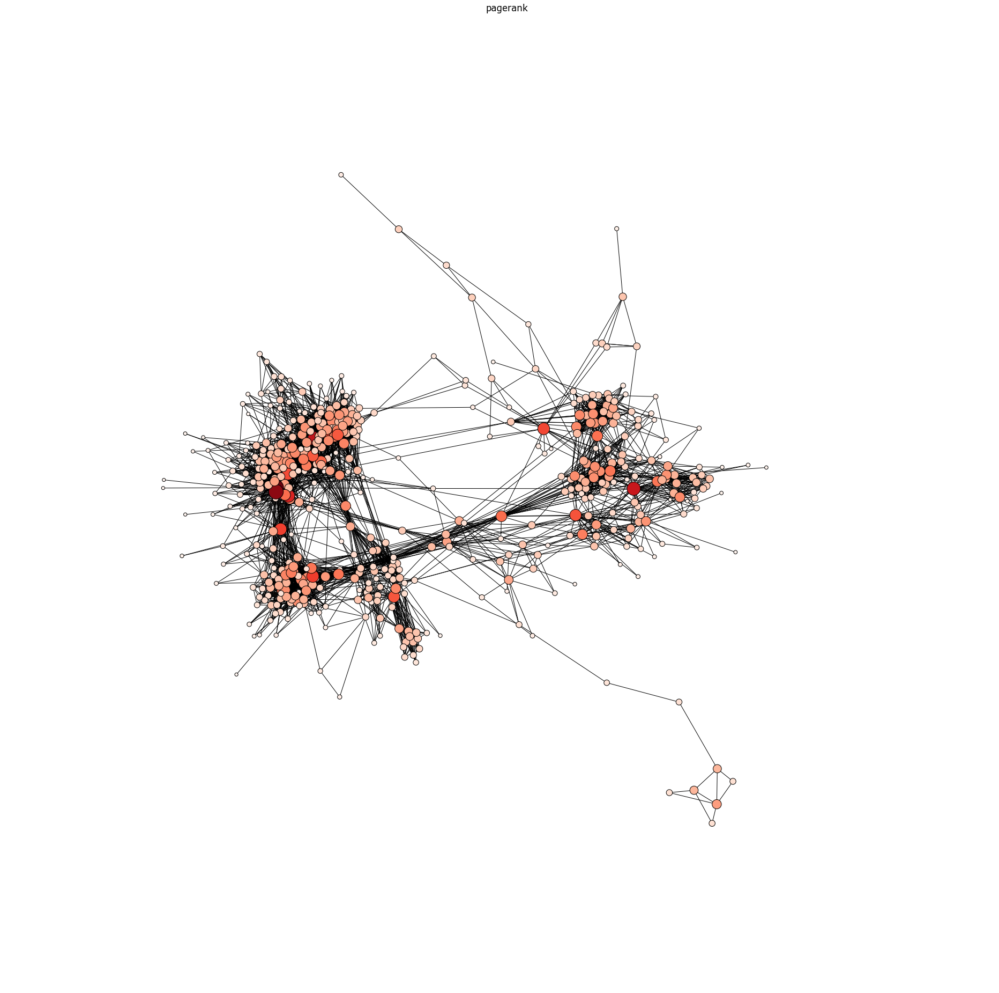

In [203]:
pr = page_rank
plt.figure(1, figsize=(25,25))
nx.draw(G,
          pos = pos,
          nodelist=pr.keys(),
          node_size = [d*100000 for d in list(pr.values())],
          node_color=list(pr.values()),
          font_size=8,
          cmap=plt.cm.Reds
          )
plt.title('pagerank')

In [ ]:
min(list(cl.values()))

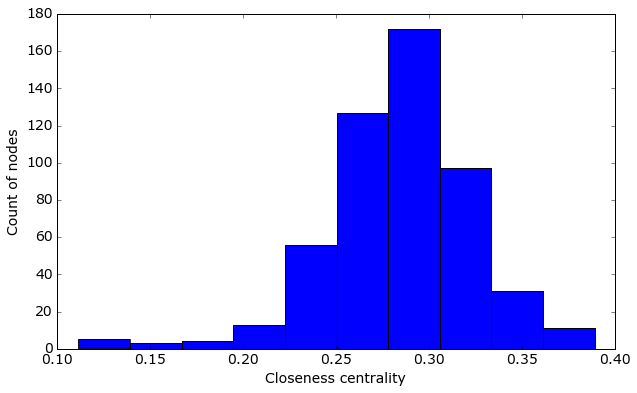

In [204]:
str_ = 'Closeness centrality'
plt.hist(list(cl.values()),bins = 10)
plt.xlabel(str_)
plt.ylabel('Count of nodes')
plt.savefig(str_+'.png')

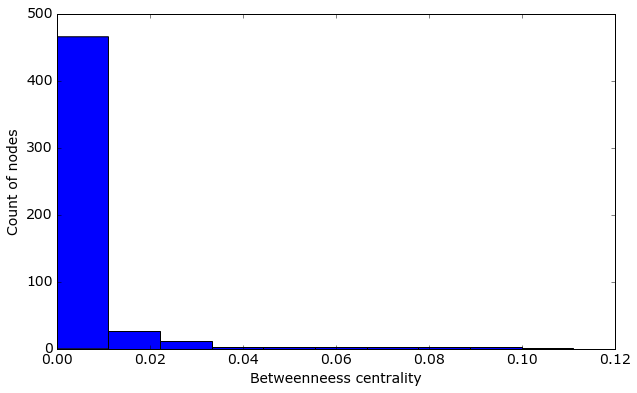

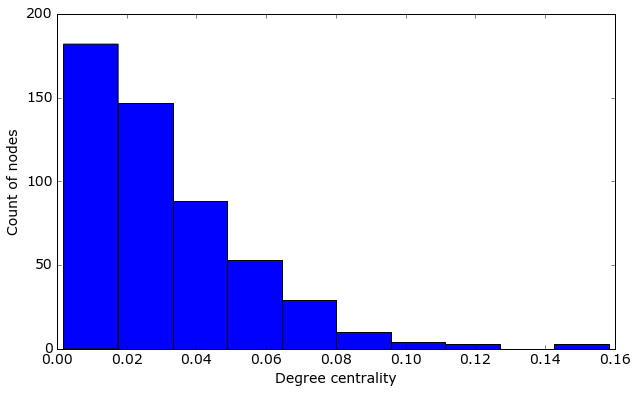

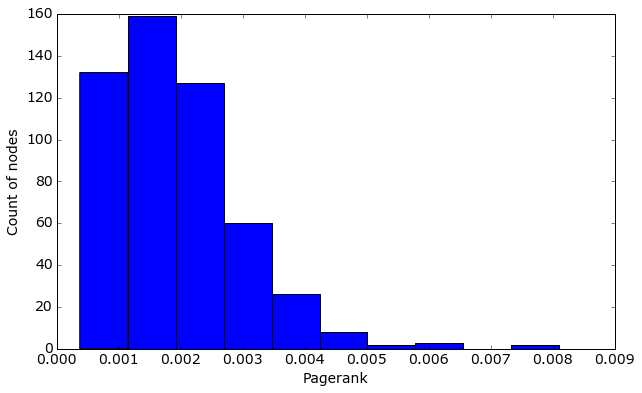

In [206]:
plt.figure()
str_ = 'Betweenneess centrality'
plt.hist(list(bc.values()),bins = 10)
plt.xlabel(str_)
plt.ylabel('Count of nodes')
plt.savefig(str_+'.png')
plt.figure()
str_ = 'Degree centrality'
plt.hist(list(dc.values()),bins = 10)
plt.xlabel(str_)
plt.ylabel('Count of nodes')
plt.savefig(str_+'.png')
str_ = 'Pagerank'
plt.figure()
plt.hist(list(pr.values()),bins = 10)
plt.xlabel(str_)
plt.ylabel('Count of nodes')
plt.savefig(str_+'.png')

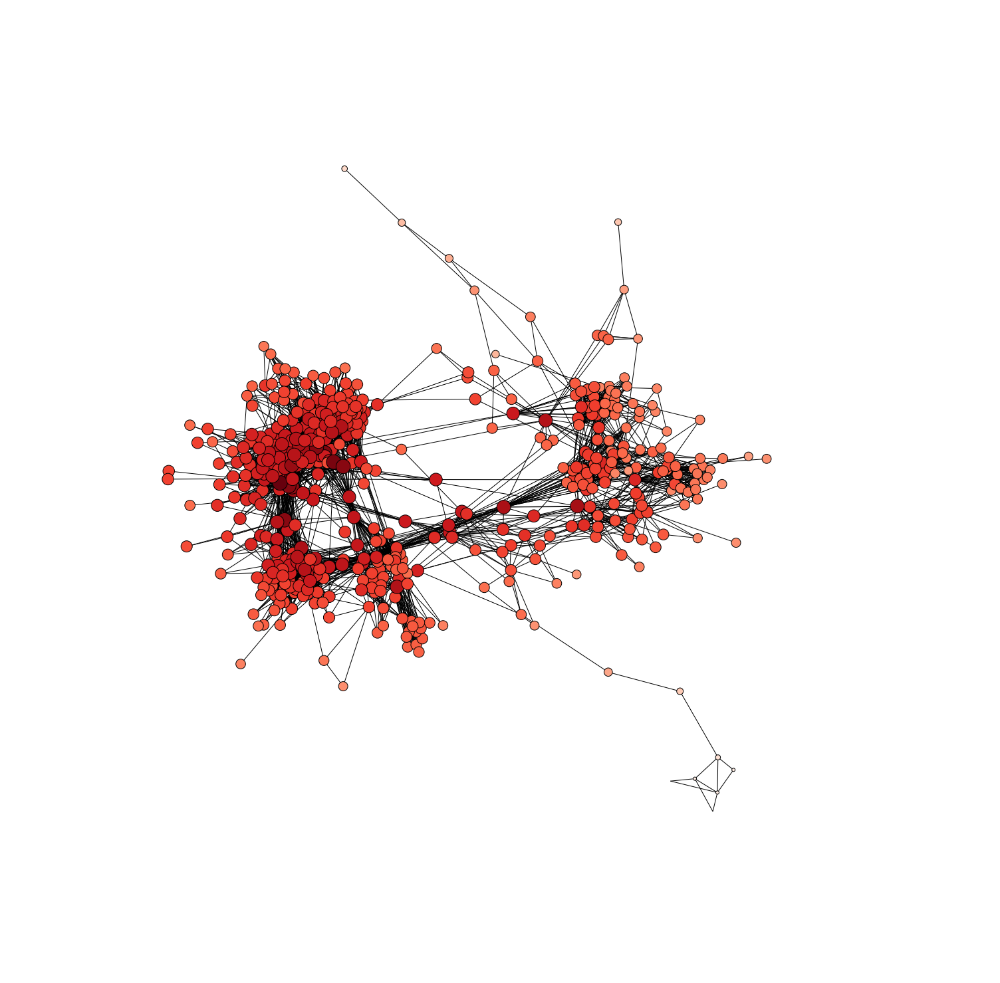

In [185]:
# Closeness centrality
cl = nx.closeness_centrality(G)
plt.figure(1, figsize=(20,20))
nx.draw(G,
          pos = pos,
          nodelist=cl.keys(),
          node_size = [(((d - min(list(cl.values())))/(max(list(cl.values()))-min(list(cl.values()))))*500) for d in list(cl.values())],
          node_color= list(cl.values()),
          font_size=8,
          cmap=plt.cm.Reds,
          )

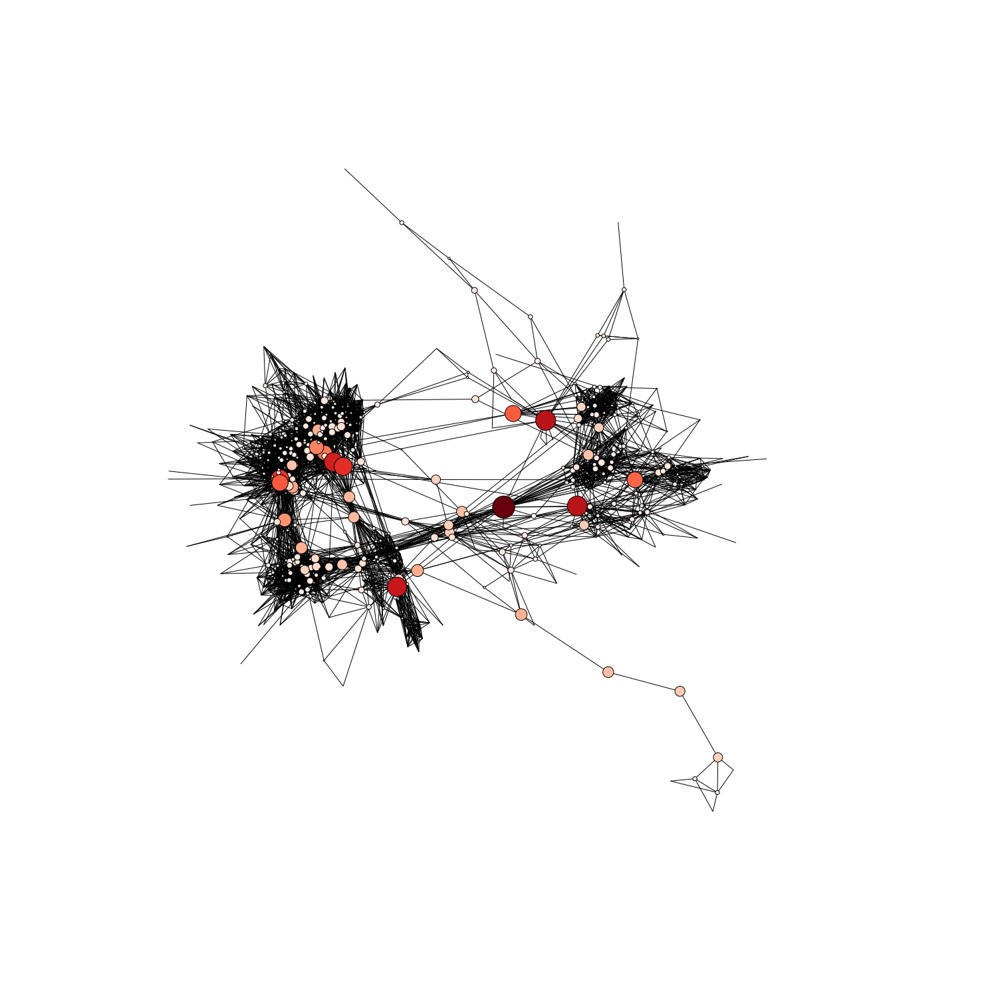

In [168]:
# betweenness centrality
bc = nx.betweenness_centrality(G)
plt.figure(1, figsize=(20,20))
nx.draw(G,
          pos = pos,
          nodelist=bc.keys(),
          node_size = [d*10000 for d in list(bc.values())],
          node_color= list(bc.values()),
          font_size=8,
          cmap=plt.cm.Reds,
          )

In [207]:
# Plot degree-closeness 
xdata = df.degree_centrality
ydata = df.closeness_centrality
plt.figure(1, figsize=(12,12))
plt.plot(xdata,ydata, '+')
plt.xlabel('Degree Centrality')
plt.ylabel('Closeness Centrality')

NameError: name 'df' is not defined

In [208]:
# Plot degree_centrality-PR 
xdata = df.degree_centrality
ydata = df.page_rank
plt.figure(1, figsize=(12,12))
plt.plot(xdata,ydata, '+')
plt.xlabel('Degree Centrality')
plt.ylabel('Page rank')

NameError: name 'df' is not defined

In [209]:
# Plot betweenneess_centrality-PR 
xdata = df.betweenness_centrality
ydata = df.page_rank
plt.figure(1, figsize=(12,12))
plt.plot(xdata,ydata, '+')
plt.xlabel('Betweennees Centrality')
plt.ylabel('Page rank')

NameError: name 'df' is not defined

In [210]:
# Plot clothness_centrality-PR 
xdata = df.closeness_centrality
ydata = df.page_rank
plt.figure(1, figsize=(12,12))
plt.plot(xdata,ydata, '+')
plt.xlabel('Closeness Centrality')
plt.ylabel('Page rank')

NameError: name 'df' is not defined

# Clustering

In [249]:
a = nx.clique.find_cliques(G)

In [225]:
pd.Series(k).value_counts()

6     64635
7     59239
5     52979
8     40317
4     32535
9     19996
3     14468
10     7020
2      4211
11     1659
1       519
12      237
13       15
dtype: int64

In [292]:
max_clique_for_node = {}
for node in tqdm(G.nodes()):
    temp = nx.cliques_containing_node(G, nodes = node)
    temp_2 = list(map(lambda x: len(x), temp))
    max_clique_for_node.update([(node,max(temp_2))])

In [250]:
max_cliques = []
set_of_nodes_in_max = []
for clique in a:
    if len(clique) == 13:
        max_cliques.append(clique)
        set_of_nodes_in_max = set_of_nodes_in_max + clique
set_of_nodes_in_max = set(set_of_nodes_in_max)

In [ ]:
# plot graph with max_clique

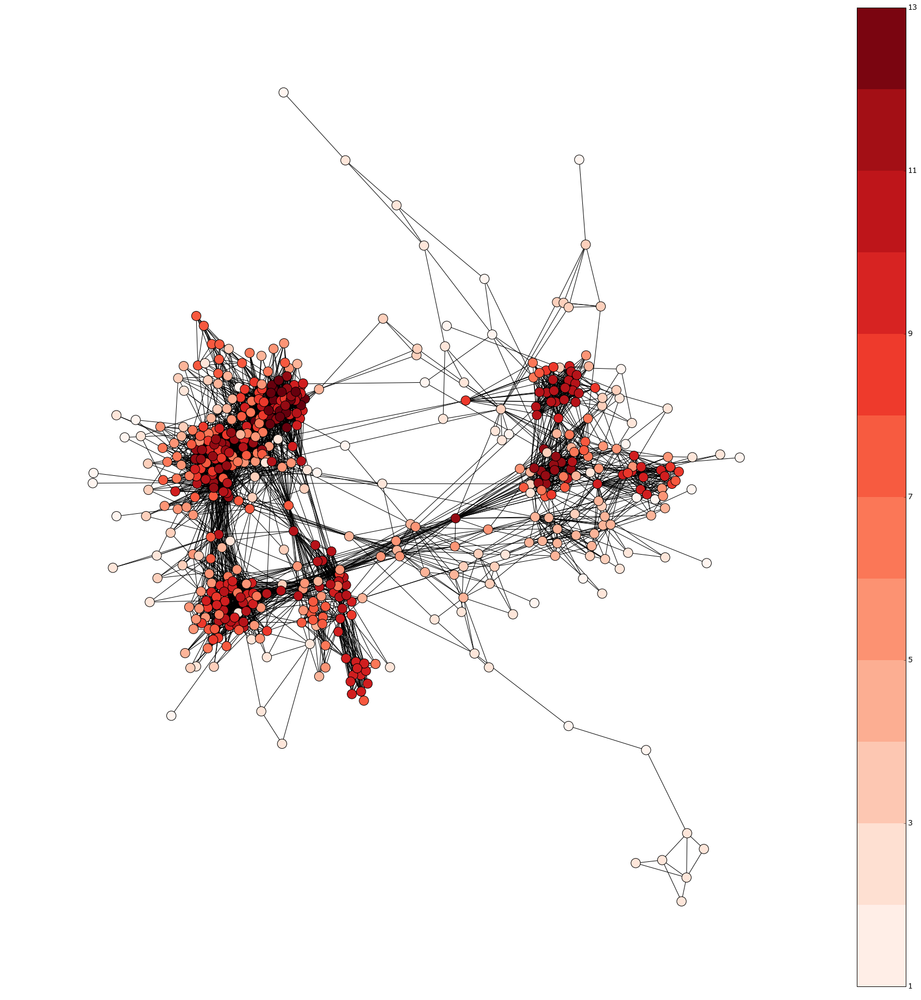

In [308]:
plt.figure(1, figsize=(25,25))
nx.draw(G,
          pos = pos,
          nodelist=list(max_clique_for_node.keys()),
          #node_size = [d*10000 for d in list(bc.values())],
          node_color= [d for d in list(max_clique_for_node.values())],
          font_size=8,
          cmap=plt.cm.Reds,
          )
Z = [[0,0],[0,0]]
CS3 = plt.contourf(Z, range(1,14), cmap=plt.cm.Reds)
plt.colorbar(CS3)

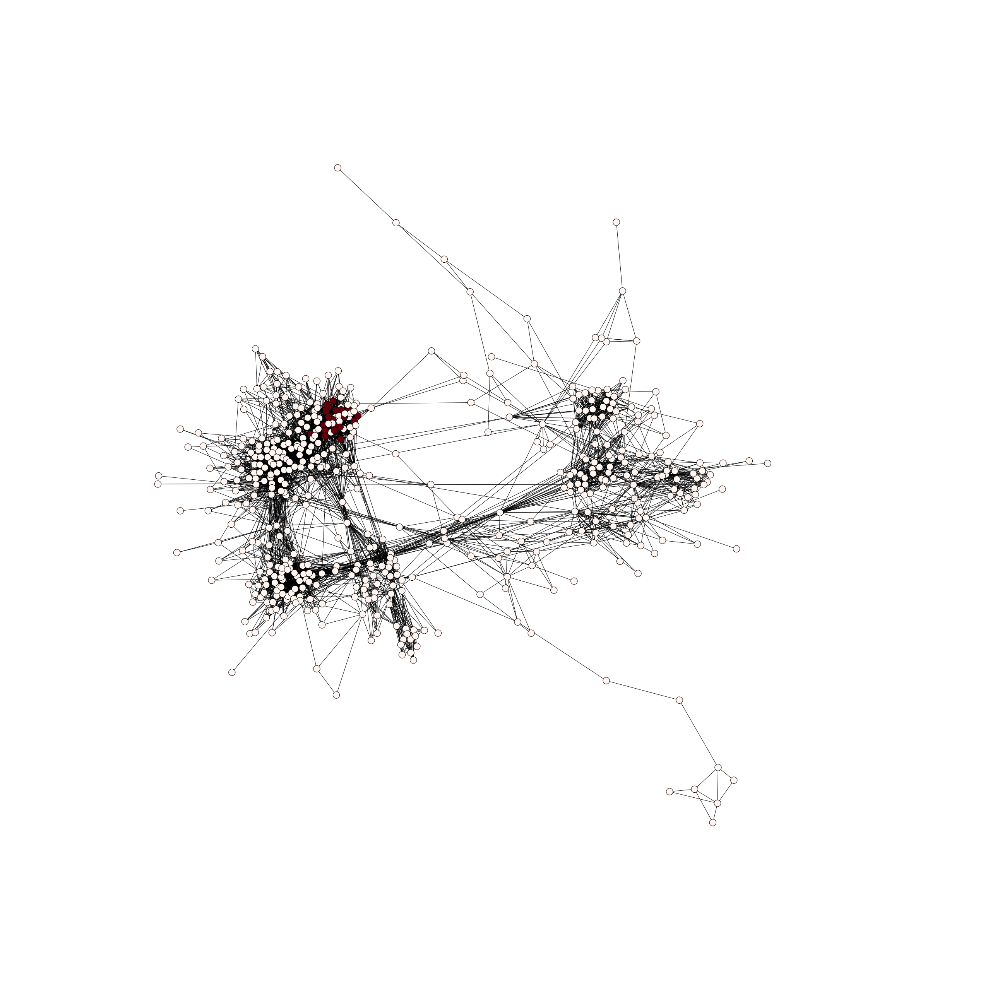

In [260]:
plt.figure(1, figsize=(35,35))
nx.draw(G,
          pos = pos,
          nodelist=G.nodes(),
          #node_size = [d*10000 for d in list(bc.values())],
          node_color= [d in set_of_nodes_in_max for d in G.nodes()],
          font_size=8,
          cmap=plt.cm.Reds,
          )

In [261]:
shell = nx.k_shell(G)

In [270]:
names_shell = {}
for i in shell.nodes():
    names_shell.update([(i,G.node[i]['lastName'])])

In [272]:
shell = nx.set_node_attributes(shell,'names',names_shell)

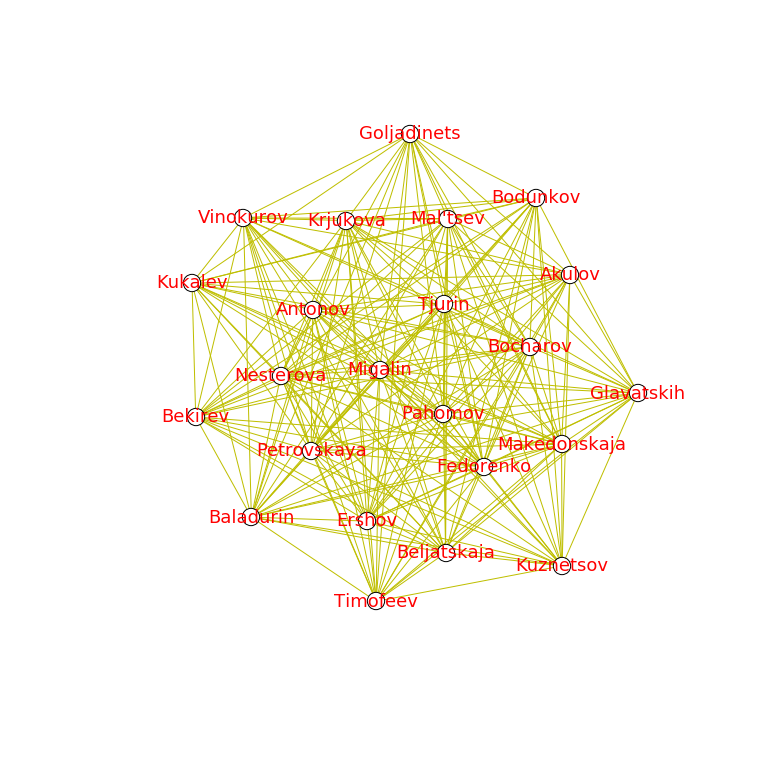

In [287]:
plt.figure(figsize=[10,10])
nx.draw(shell,pos = nx.layout.spring_layout(shell,k = 1),labels = names_shell,node_color='w',edge_color='y',font_color = 'r',font_size = 18)

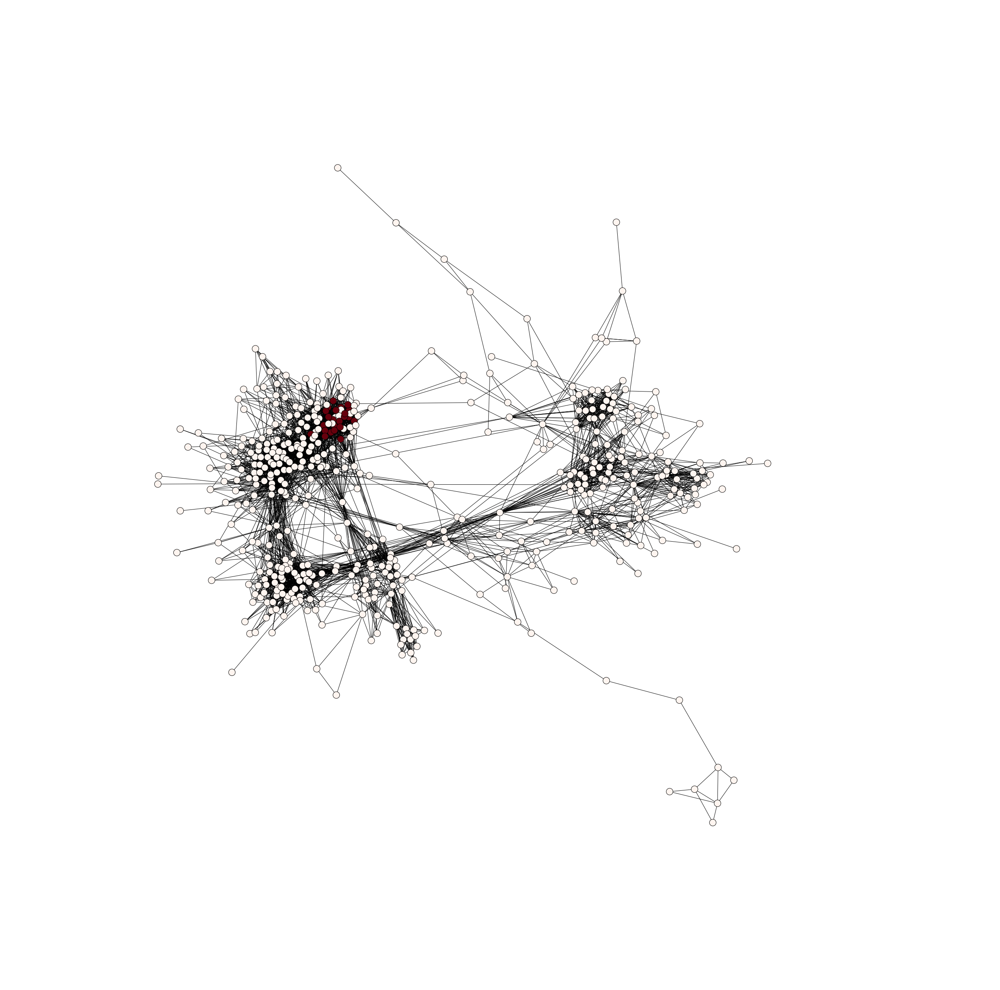

In [288]:
plt.figure(1, figsize=(35,35))
nx.draw(G,
          pos = pos,
          nodelist=G.nodes(),
          #node_size = [d*10000 for d in list(bc.values())],
          node_color= [d in shell.nodes() for d in G.nodes()],
          font_size=8,
          cmap=plt.cm.Reds,
          )

# Just clusterization

In [326]:
from numpy.random import choice, rand 

In [337]:
def RandomWalk(G, xi, n, till_first_return = False):
    nodeSeq = []
    nodeSeq.append(xi)
    if till_first_return:
        xInit = xi
        while True:
            neig = np.array(G.neighbors(xi))
            xi = choice(G.neighbors(xi),1)[0]       
            nodeSeq.append(xi)
            if xi == xInit:
                return nodeSeq
    else:
        for i in range(n):
            neig = np.array(G.neighbors(xi))
            xi = choice(G.neighbors(xi),1)[0]       
            nodeSeq.append(xi)
        return nodeSeq


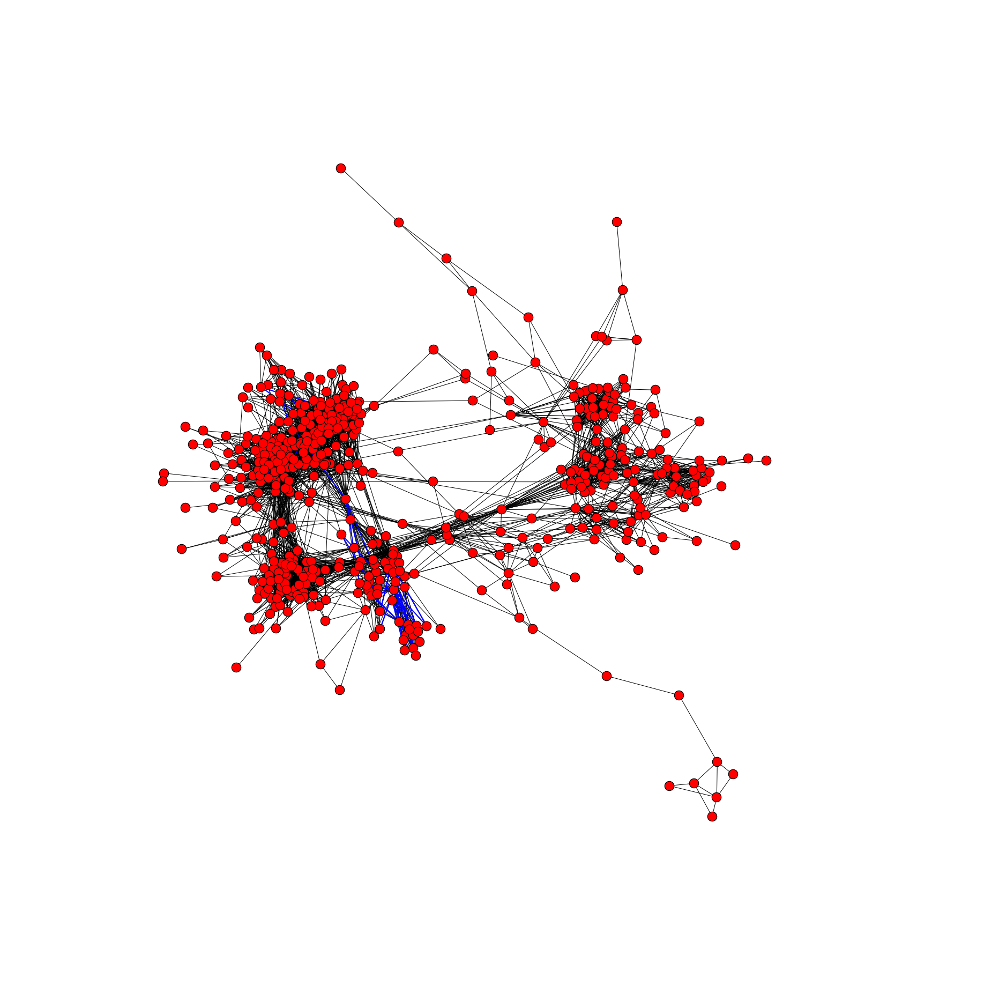

In [340]:
nodeSeq = RandomWalk(G, G.nodes()[0], 100)
edgeSeq = [(nodeSeq[i-1], nodeSeq[i]) for i in range(1,len(nodeSeq))]
plt.figure(1, figsize=(25,25))
nx.draw(G, pos)
nx.draw(G, pos, edgelist = edgeSeq, edge_color='blue', width=2)

In [348]:
import igraph.test
igraph.test.run_tests()

...................................................................................................................................................................................................................................................................................................................
----------------------------------------------------------------------
Ran 307 tests in 23.867s

OK


In [349]:
import igraph as ig

In [359]:
iG = ig.read("IlyaIvanitskiy_trunk"+str(1)+".gml",format = 'gml')

# Let's see on random graph model

In [390]:
ba = nx.random_graphs.barabasi_albert_graph(len(G.nodes()), 8,seed=42)
er = nx.random_graphs.erdos_renyi_graph(len(G.nodes()),1./10,seed=42)
sw = nx.random_graphs.watts_strogatz_graph(len(G.nodes()),12,0.2,seed=42)

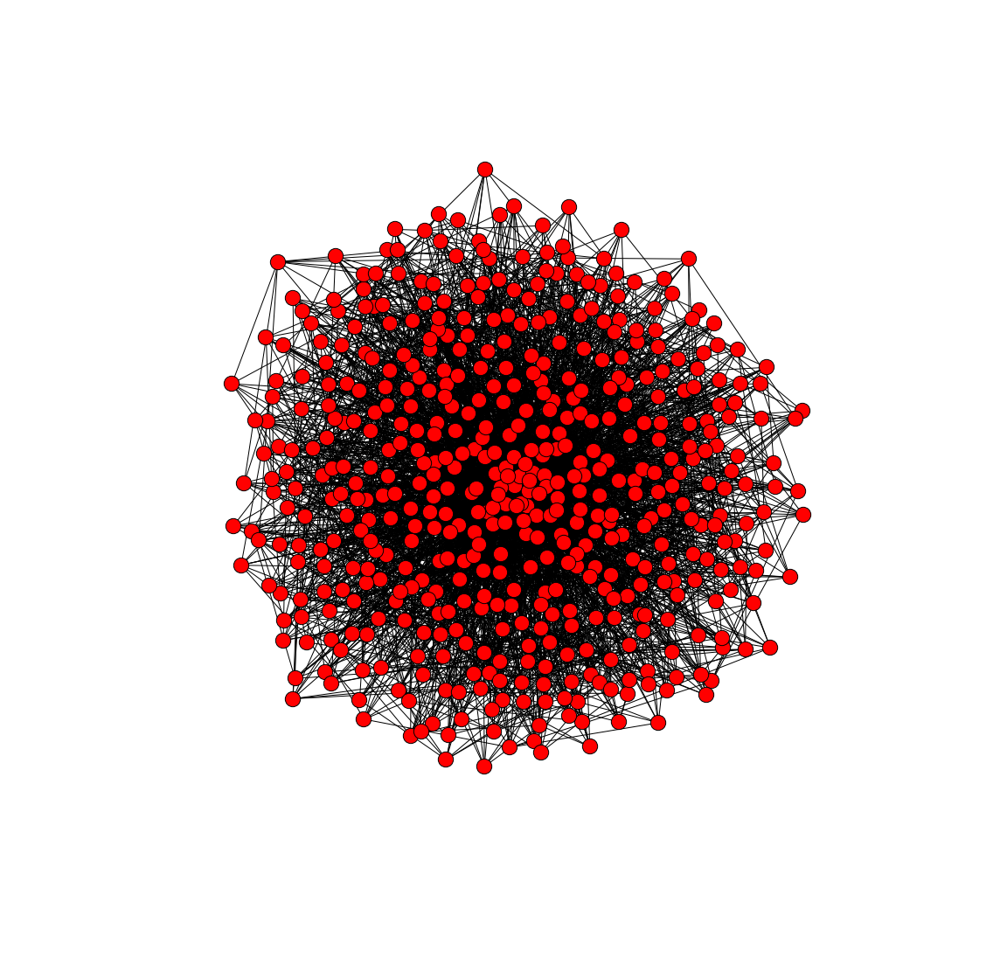

In [391]:
plt.figure(figsize=[15,15])
nx.draw(ba, pos = nx.layout.spring_layout(ba,k = 1/10.))

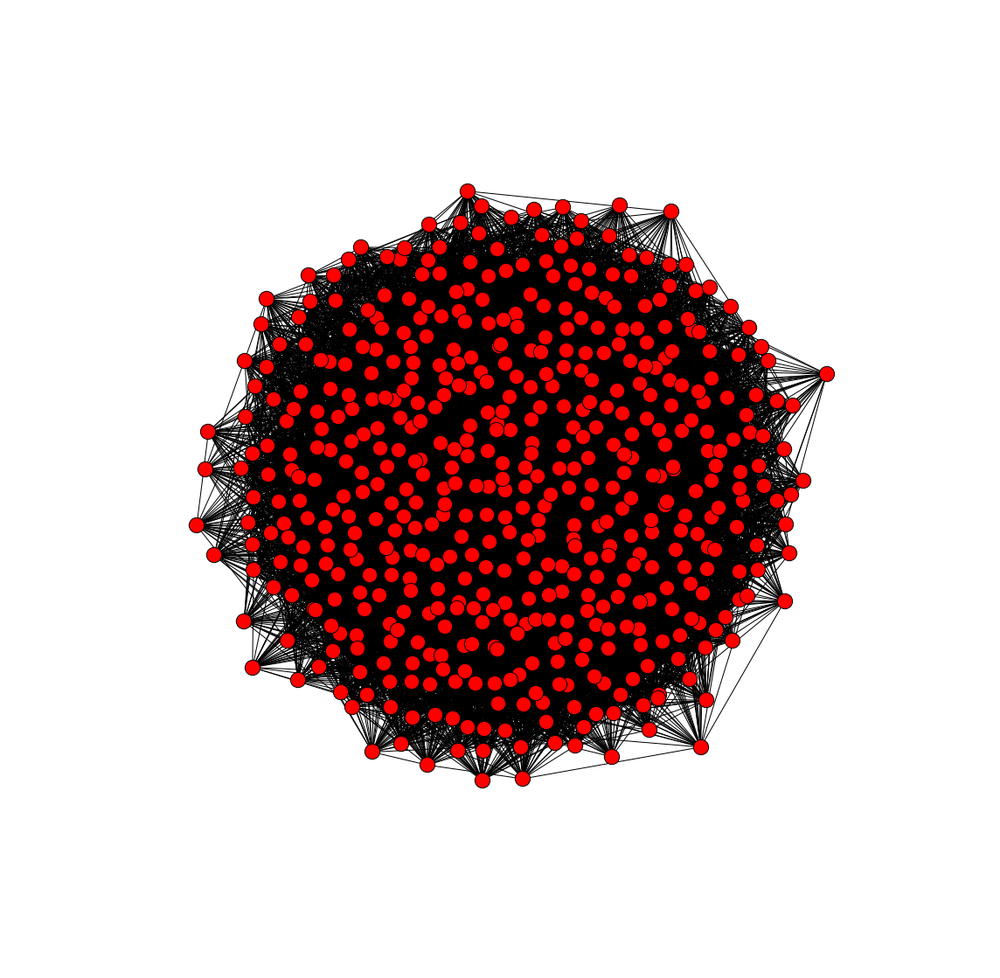

In [392]:
plt.figure(figsize=[15,15])
nx.draw(er, pos = nx.layout.spring_layout(er,k = 1/10.))

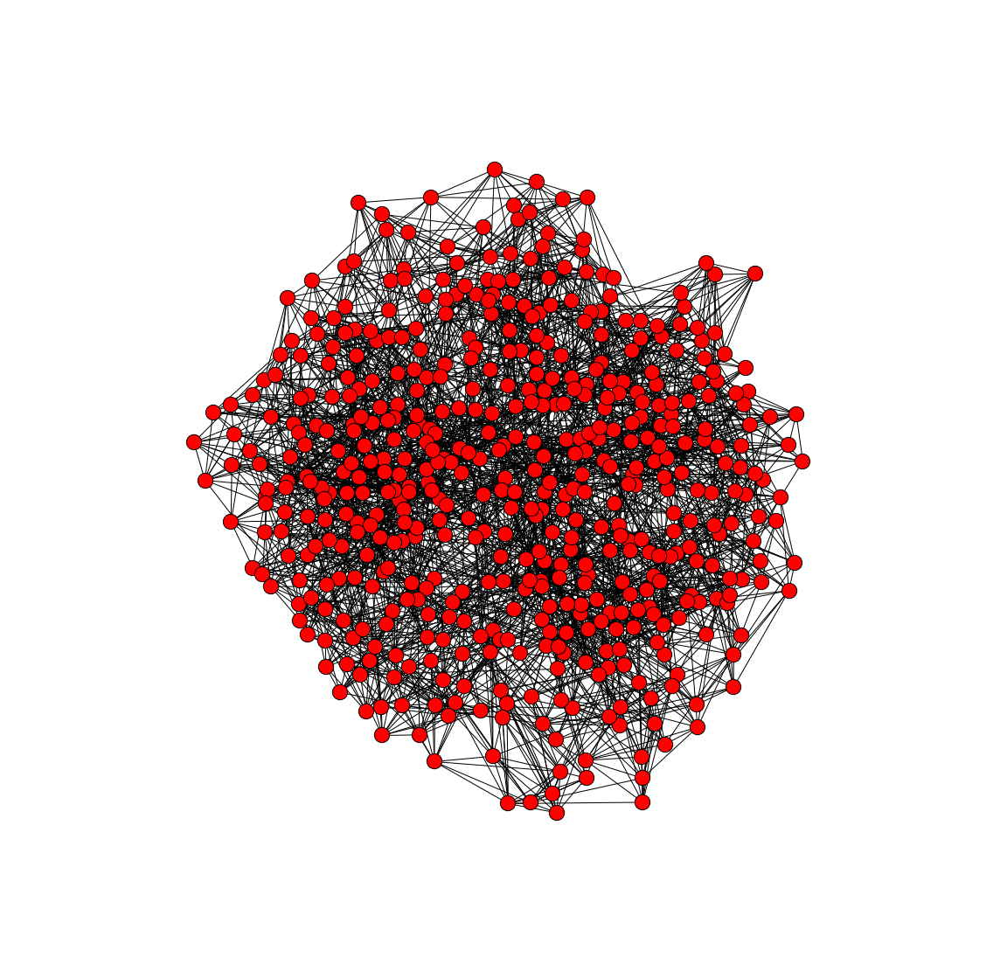

In [393]:
plt.figure(figsize=[15,15])
nx.draw(sw, pos = nx.layout.spring_layout(sw,k = 1/10.))